In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import os

import matplotlib.dates as mdates
pd.set_option('display.max_columns',271)
from bs4 import BeautifulSoup
from requests import get
import datetime as dt
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf
matplotlib.rcParams.update({'font.size': 15})

# Problem Statement

Aim: Your team is working on building a variety of insight packs to measure key trends in the Agriculture sector in India. You are presented with a data set around Agriculture and your aim is to understand trends in APMC (Agricultural produce market committee)/mandi price & quantity arrival data for different commodities in Maharashtra.

Objective:

* Test and filter outliers.
    
* Understand price fluctuations accounting the seasonal effect
    
* Detect seasonality type (multiplicative or additive) for each cluster of APMC and commodities
    
* De-seasonalise prices for each commodity and APMC according to the detected seasonality type
    
* Compare prices in APMC/Mandi with MSP(Minimum Support Price)- raw and deseasonalised
    
* Flag set of APMC/mandis and commodities with highest price fluctuation across different commodities in each   relevant season, and year.
    

Variable description:
* msprice- Minimum Support Price
* arrivals_in_qtl- Quantity arrival in market (in quintal)
* min_price- Minimum price charged per quintal
* max_price- Maximum price charged per quintal
* modal_price- Mode (Average) price charged per quintal



# Methodology

### 1. Cleaning the Data:
The dataset given has many spelling errors and irregularities in Commodity names. First, unnecessary spaces are removed. Then, to correct spelling errors in Commodities, I first scrapped Commodity names from 'http://agmarknet.gov.in/' and used them as reference to correct.

### 2. Outlier Removal:
- The first step in removing outliers was to remove commodities that have modal price <=0.
- IQR(Interquartile range) Score was used to remove the remaining outliers.

### 3. Detecting Seasonality type:
- Seasonality was detected by measuring the sum of squares of Auto correclation Function (ACF) of residuals of modal price of both multiplicative and additive models.
- The model having lowest sum of square was selected to de-seasonalize the data.

### 4. Flagging set of APMC and commodities having highest Price Fluctuations:
 - Standard deviation of de-seasonalized modal price of each and every commodity across all APMCs is     calculated per year.
 - Then, Standard deviation of each APMC-Commodity group is calculated per year.
 - Finally, a ratio of standard deviation of de-seasonalized modal price of every commodity and StdDev of each APMC-Commodity group is calculated to measure fluctuations in price

# Conclusion

### 1. Deviation from MSP
From the plots we can clearly see that some commodities such as Wheat(unhusked) in APMC sangli is sold at a price 220% than its corresponding MSP. We also see observe some more commodities such as Split Black gram which in APMC Mumbai which is sold at 250% more than its MSP. Overall, majorirty of the commodities are sold around 30-40% more than their MSPs. 

We also observe some commodities which are sold less 30-40% less than their MSPs. These are : Jowar(Sorghum), Pegeon pea (tur) etc.


### 2. Price Fluctuations:
From the horizontal bar chart it is clear that in the Year:
 - 2014 : Wheat(husked) at APMC Bokhar had highest price fluctuation followed by Soyabean at APMC Chopda, Soyabean at APMC Dhule, Pegeon pea (tur) at APMC Duryapur etc.
 - 2015 : Soyabean at APMC Digras had highest price fluctuation followed by Bajra at Khamgaon, Wheat(husked) at Bhivandi, Bajra at Majalogaon etc.
 - 2016 : Pegeon Pea (tur) at Washim had highest price fluctuattions followed by Pegeon Pea (tur) at Umared, Pegeon Pea (tur) at Naned etc. Thus, we can say that Pegeon Pea (Tur) at several APMCs had highest price fluctuations.

### Reading the dataframe

In [2]:
cmo_mandi    = pd.read_csv('CMO_MSP_Mandi.csv')
monthly_data = pd.read_csv('Monthly_data_cmo.csv')

In [3]:
monthly_data.head()

,APMC,Commodity,Year,Month,arrivals_in_qtl,min_price,max_price,modal_price,date,district_name,state_name
0,Ahmednagar,Bajri,2015,April,79,1406,1538,1463,2015-04,Ahmadnagar,Maharashtra
1,Ahmednagar,Bajri,2016,April,106,1788,1925,1875,2016-04,Ahmadnagar,Maharashtra
2,Ahmednagar,Wheat(Husked),2015,April,1253,1572,1890,1731,2015-04,Ahmadnagar,Maharashtra
3,Ahmednagar,Wheat(Husked),2016,April,387,1750,2220,1999,2016-04,Ahmadnagar,Maharashtra
4,Ahmednagar,Sorgum(Jawar),2015,April,3825,1600,2200,1900,2015-04,Ahmadnagar,Maharashtra


In [4]:
#Converting Date in monthly data to datetime from Object
monthly_data.date = pd.to_datetime(monthly_data.date)

### Cleaning the Commodity Column from both the dataframes

In [5]:
#converting all values in commodity column to lower case
monthly_data.Commodity = monthly_data.Commodity.apply(lambda x: x.lower())
cmo_mandi.commodity    = cmo_mandi.commodity.apply(lambda x: x.lower())

#Removing any trailing or leading blank spaces from the words
monthly_data.Commodity = monthly_data.Commodity.apply(lambda x: x.rstrip())
cmo_mandi.commodity    = cmo_mandi.commodity.apply(lambda x: x.rstrip())

monthly_data.Commodity = monthly_data.Commodity.apply(lambda x: x.lstrip())
cmo_mandi.commodity    = cmo_mandi.commodity.apply(lambda x: x.lstrip())

In [6]:
cmo_mandi.commodity.unique()

array(['paddy-unhusked', 'rice(paddy-hus)', 'jowar_hybrid',
       'sorgum(jawar)', 'bajri', 'maize', 'ragi_maldandi',
       'pigeon pea (tur)', 'spilt gerrn gram', 'split black gram',
       'cotton', 'cotton_long staple', 'gr.nut kernels', 'sunflower',
       'soyabean_black', 'soyabean', 'sesamum', 'niger-seed',
       'wheat(husked)', 'wheat(unhusked)', 'barli', 'gram_yellow',
       'masur_yellow', 'mustard', 'safflower', 'toria_yellow',
       'copra (milling)_yellow', 'copra (ball)_yellow', 'coconut',
       'jute_yellow', 'sugar-cane', 'sugarcane'], dtype=object)

In [7]:
url = 'http://agmarknet.gov.in/'
response = get(url)

html_soup = BeautifulSoup(response.text,'html.parser')

commodity_containers = html_soup.find_all('div', class_ = 'commodity')

commodity_list = [i.text.lower() for i in commodity_containers[1].find_all('option')[1:]]

In [8]:
commodity_list

['ajwan',
 'alasande gram',
 'almond(badam)',
 'alsandikai',
 'amaranthus',
 'ambada seed',
 'amla(nelli kai)',
 'amphophalus',
 'antawala',
 'anthorium',
 'apple',
 'apricot(jardalu/khumani)',
 'arecanut(betelnut/supari)',
 'arhar (tur/red gram)(whole)',
 'arhar dal(tur dal)',
 'ashgourd',
 'astera',
 'avare dal',
 'bajra(pearl millet/cumbu)',
 'balekai',
 'bamboo',
 'banana',
 'banana - green',
 'barley (jau)',
 'bay leaf (tejpatta)',
 'beans',
 'beaten rice',
 'beetroot',
 'bengal gram dal (chana dal)',
 'bengal gram(gram)(whole)',
 'ber(zizyphus/borehannu)',
 'betal leaves',
 'betelnuts',
 'bhindi(ladies finger)',
 'big gram',
 'binoula',
 'bitter gourd',
 'black gram (urd beans)(whole)',
 'black gram dal (urd dal)',
 'black pepper',
 'bop',
 'borehannu',
 'bottle gourd',
 'bran',
 'brinjal',
 'broken rice',
 'broomstick(flower broom)',
 'bull',
 'bullar',
 'bunch beans',
 'butter',
 'cabbage',
 'calf',
 'camel hair',
 'cane',
 'capsicum',
 'cardamoms',
 'carnation',
 'carrot',
 'c

In [11]:
#based on the commodity list obtained correcting spellings of the commodities in the dataframe
spelling_dict = {'bajri':'bajra(pearl millet/cumbu)',
                'horse gram':'kulthi(horse gram)',
                'sorgum(jawar)':'jowar(sorghum)', 
                'maize (corn.)':'maize','maize(corn.)':'maize',
                'matki':'mataki','soybean':'soyabean',
                'pigeon pea (tur)':'pegeon pea(tur)','spilt pigeon pea':'spilt pegeon pea',
                'pigen-pea (bhaji)':'pegeon-pea(bhaji)',
                'kharbuj':'kharbuja', 'mosambi':'mousambi(sweet lime)',
                'oth.split pulses':'other split pulses',
                'gr.nut kernels':'ground nut kernels',
                'skin & bones':'skin & hide',
                'jowar_hybrid':'jowar(hybrid)','ragi_maldandi':'ragi(finger millet)',
                'cotton_long staple':'cotton(long staple)','soyabean_black':'soyabean(black)',
                'gram_yellow':'gram(yellow)','masur_yellow':'lentil(masur)',
                'toria_yellow':'toria','copra (milling)_yellow':'copra(milling yellow)',
                'copra (ball)_yellow':'copra(ball yellow)','jute_yellow':'jute',
                'sugar-cane':'sugarcane'}

#Correcting the spellings of commodities in cmo_mandi and monthly_data
cmo_mandi.commodity = cmo_mandi.commodity.apply(lambda x: spelling_dict[x] if x in spelling_dict.keys() else x)
monthly_data.Commodity = monthly_data.Commodity.apply(lambda x: spelling_dict[x] if x in spelling_dict.keys() else x)


In [12]:
monthly_data.describe()

,Year,arrivals_in_qtl,min_price,max_price,modal_price
count,62429.000000,6.242900e+04,6.242900e+04,6.242900e+04,62429.000000
mean,2015.337503,6.043088e+03,2.945228e+03,3.688814e+03,3296.003989
std,0.690451,3.470331e+04,1.318396e+04,7.662962e+03,3607.792534
min,2014.000000,1.000000e+00,0.000000e+00,0.000000e+00,0.000000
25%,2015.000000,3.800000e+01,1.250000e+03,1.600000e+03,1450.000000
50%,2015.000000,2.110000e+02,1.976000e+03,2.797000e+03,2425.000000
75%,2016.000000,1.364000e+03,3.900000e+03,4.647000e+03,4257.000000
max,2016.000000,1.450254e+06,3.153038e+06,1.600090e+06,142344.000000


### Testing for outliers

#### 1. The first step in testing for outliers is removing all the points that have modal price as less than or equal to zero. This is done because a commodity cannot have a zero valuation.

In [13]:
#Calculating number of points having modal_price as <=0
print('Shape of dataframe before removing outliers is ',monthly_data.shape)
print('Number of datapoints having modal_price<=0 are %d'%monthly_data[monthly_data.modal_price<=0].shape[0])
#Subsetting for data points having modal_price >0
monthly_data = monthly_data[monthly_data.modal_price>0]
print('Shape of data points after removing the 0 modal price outliers is ', monthly_data.shape)

Shape of dataframe before removing outliers is  (62429, 11)
Number of datapoints having modal_price<=0 are 204
Shape of data points after removing the 0 modal price outliers is  (62225, 11)


#### 2. For filtering out the outliers I will be using IQR score. IQR score is calculated as follows:

The interquartile range (IQR), also called the midspread or middle 50%, or technically H-spread, is a measure of statistical dispersion, being equal to the difference between 75th and 25th percentiles, or between upper and lower quartiles, IQR = Q3 − Q1

Now, a lower quartile zone which is Q1 - 1.5xIQR and upper quartile zone Q3 + 1.5xIQR is defined. A data point will be classified as anomaly if it lies outside of these bounds 

In [14]:
#Plotting time series of All Commodities that are common in cmo_mandi and monthly data as scatter plots to check
#for outliers

cmo_commodities          = cmo_mandi.commodity.unique() 
monthly_data_commodities = monthly_data.Commodity.unique()

#Getting the common commodities
common_commodities = set(cmo_commodities).intersection(set(monthly_data_commodities))

Plotting the common commodities to look for outliers (inlcuding all APMCs).

This is done to validate and check how well the Upper and lower quartile range method is working to filter out the outliers in the data set

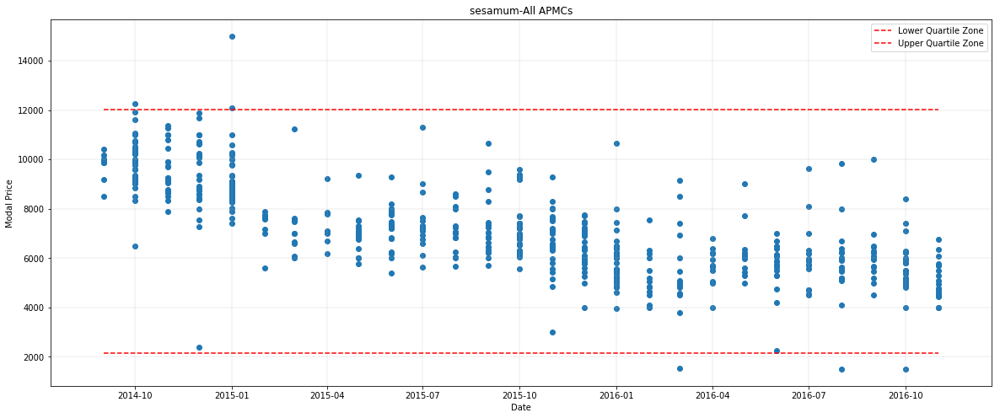

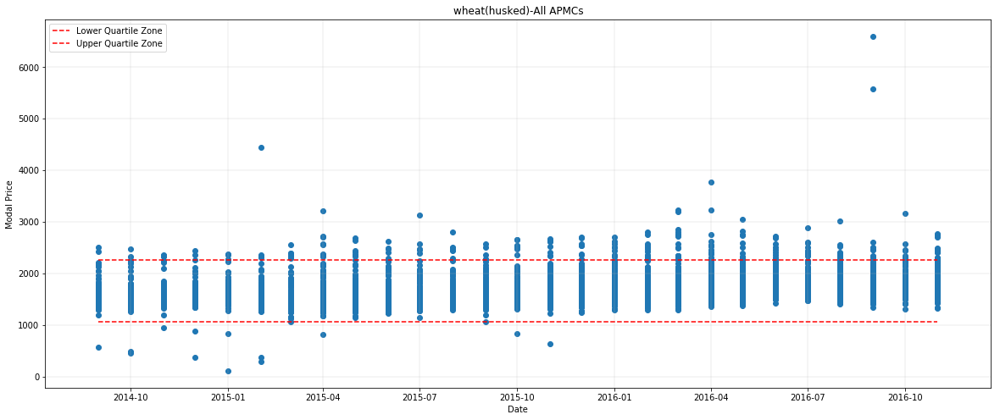

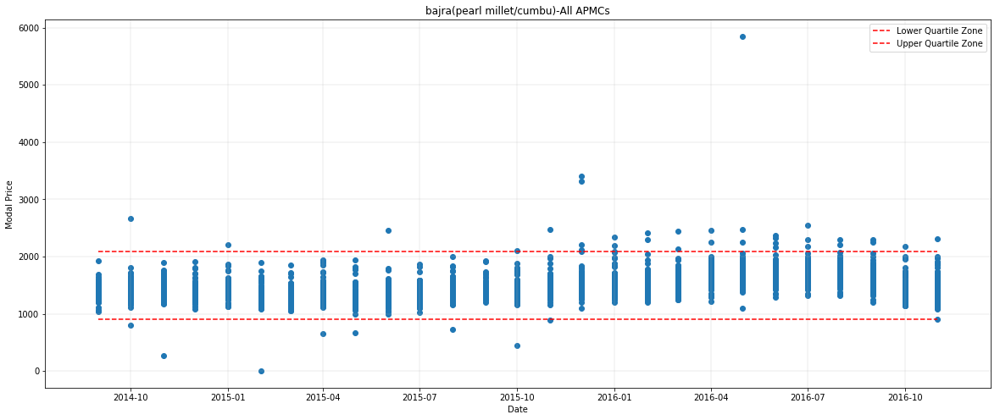

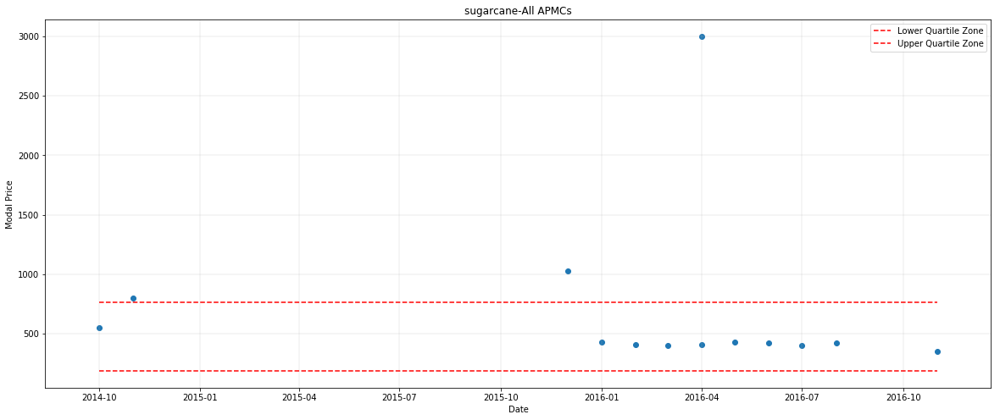

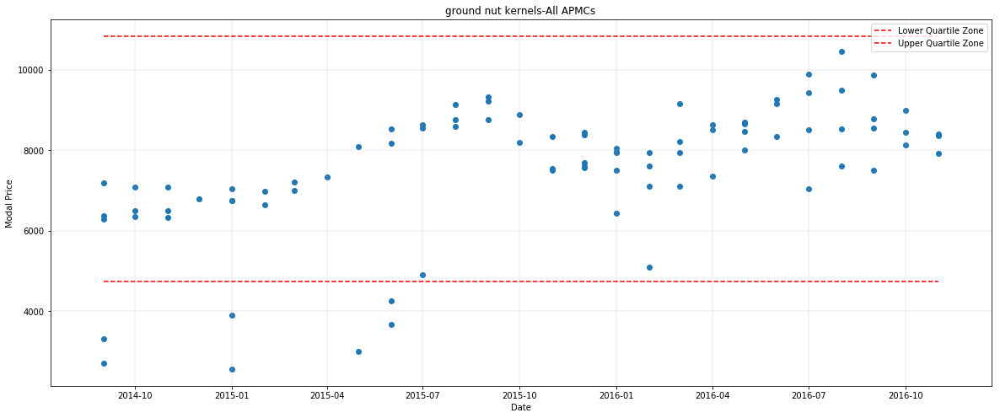

...

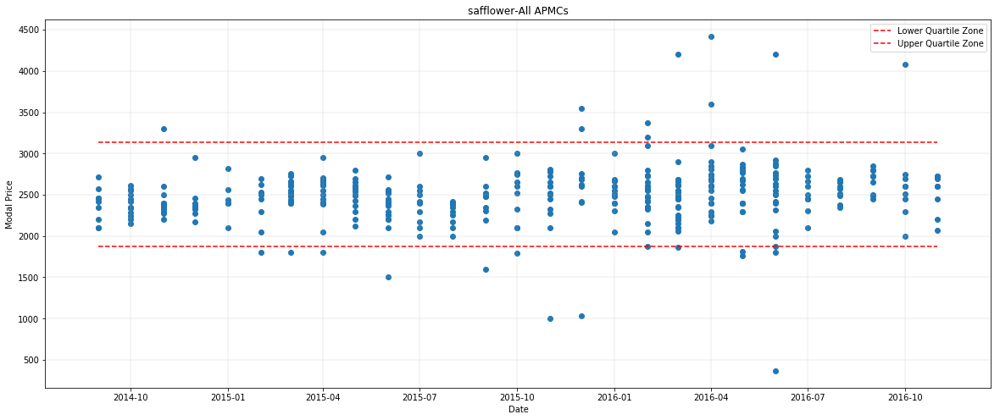

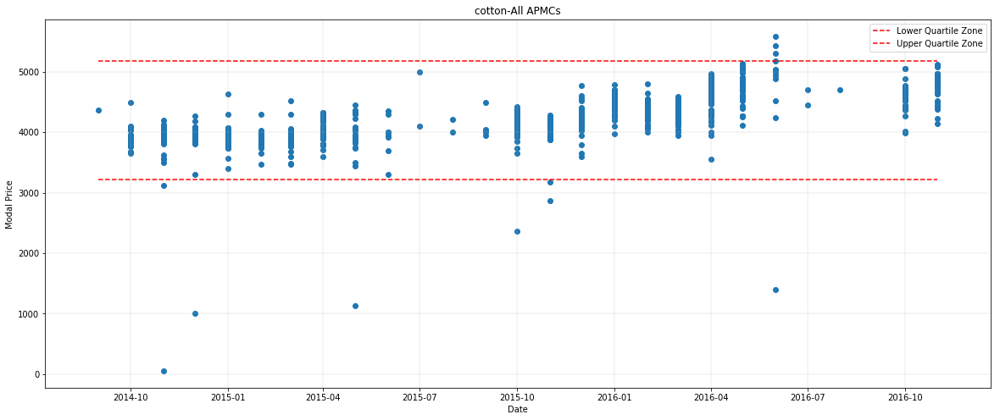

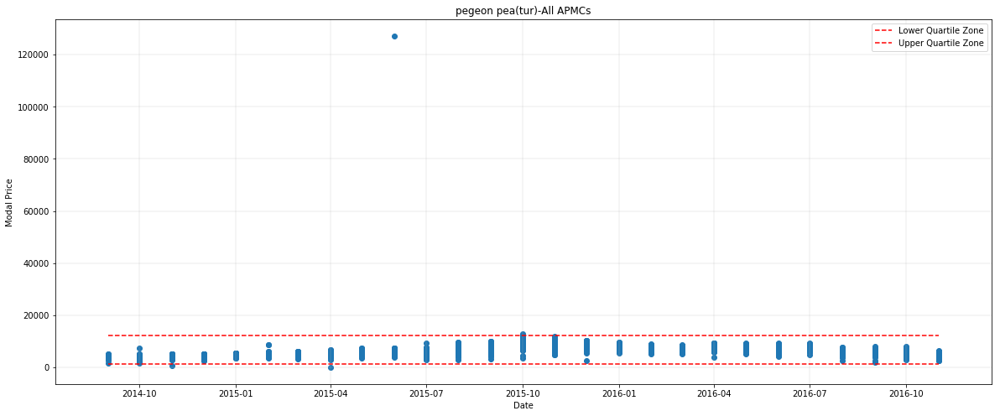

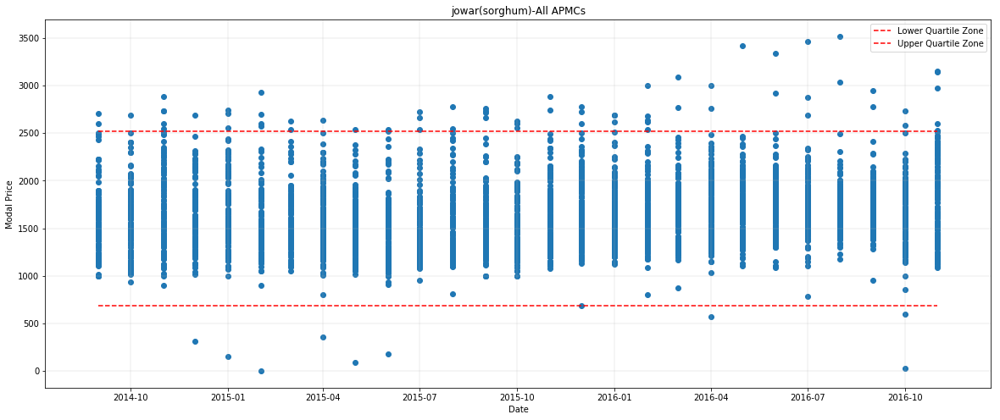

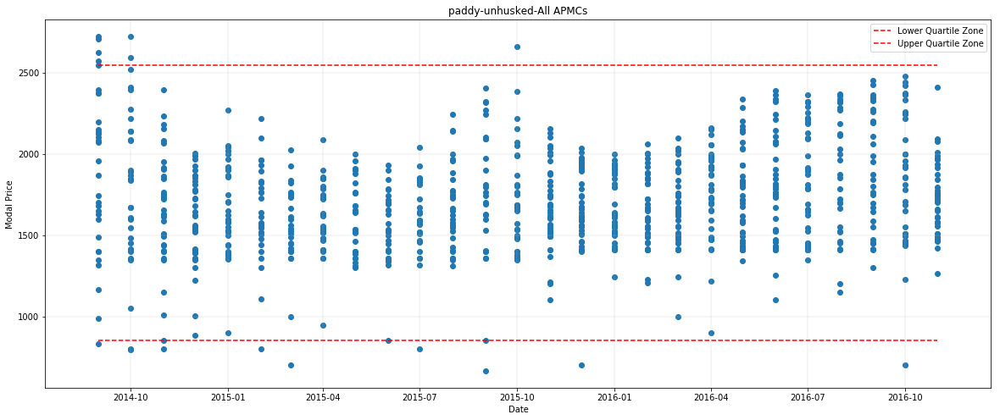

In [15]:
#Plotting the common commodities to look for outliers (inlcuding all APMCs) 
# This is done to validate and check how well the Upper and lower quartile range method is 
# working to filter out the outliers in the data set
for commodity in common_commodities:
    
    temp = monthly_data[monthly_data.Commodity==commodity]   #subsetting data for each commodity
    temp.sort_values(by='date')                              #Sorting it by dates
    
    #Calculating interquantile range for removing outliers
    Q1 = temp.quantile(0.25)['modal_price']
    Q3 = temp.quantile(0.75)['modal_price']
    IQR = Q3 - Q1
 
    
    fig,ax = plt.subplots(1,1,figsize=(20,8))
    ax.scatter(temp.date.values,temp.modal_price.values)
    ax.set(xlabel='Date',ylabel='Modal Price',title='%s-All APMCs'%(commodity))
    ax.hlines(Q1 - 1.5 * IQR,xmin=temp.date.min(),xmax=temp.date.max(),color='r',linestyles='--',
              label='Lower Quartile Zone')
    ax.hlines(Q3 + 1.5 * IQR,xmin=temp.date.min(),xmax=temp.date.max(),color='r',linestyles='--',
              label='Upper Quartile Zone')
    ax.grid(linewidth=0.25)
    ax.legend()


From the above graphs we can clearly see that IQR method does a pretty decent job of giving us threshold for higher and lower ourliers. Thus, this method is used to filter the whole monthly_data for outliers.

In [16]:
#Filtering the data set for outliers
monthly_data_filtered = pd.DataFrame()
for commodity in monthly_data.Commodity.unique():
    #Filtering data for each commodity
    temp = monthly_data[monthly_data.Commodity==commodity]
    Q1 = temp.quantile(0.25)['modal_price']
    Q3 = temp.quantile(0.75)['modal_price']
    IQR = Q3 - Q1
    #Filtering for lower quartile zone
    temp_filtered = temp[temp.modal_price > (Q1 - 1.5 * IQR)]
    #Filtering for upper quartile zone
    temp_filtered = temp_filtered[temp_filtered.modal_price < (Q3 + 1.5 * IQR)]
    monthly_data_filtered = pd.concat([monthly_data_filtered,temp_filtered])

In [17]:
print('Shape of the data frame after filtering ',monthly_data_filtered.shape)

Shape of the data frame after filtering  (60311, 11)


Therefore, the number of datapoints after filtering are 60311. Thus, in total **2118 (3.4%)** data points were filtered.

In [18]:
#Saving filtered dataframe
monthly_data_filtered.to_csv('monthly_data_filtered.csv')

# Understanding Price fluctuations with Seasonal Effects

To understand and model seasonality and trend, I will only be considering APMC-Commodity groups that have more than 24 data points. This has been to ensure that we have enough datapoints for every commodity/APMC to model and understand seasonality. Since the data is monthly 24 data points will be 24 months which will be sufficient to identify a seaosnal cycle

In [19]:
#Creating an APMC-Commodity column
monthly_data_filtered['APMC-Commodity'] = monthly_data_filtered.APMC.values + '-' + monthly_data_filtered.Commodity.values

#Filtering the APMC-Commodity groups that have less than 24 data points
monthly_data_grouped = monthly_data_filtered.groupby('APMC-Commodity').filter(lambda x: x['APMC-Commodity'].size>=24)

print('Unique APMC-Commodity groups before subsetting : %d'%len(monthly_data_filtered['APMC-Commodity'].unique()))
print('Unique APMC-Commodity groups after subsetting  : %d'%len(monthly_data_grouped['APMC-Commodity'].unique()))



Unique APMC-Commodity groups before subsetting : 4722
Unique APMC-Commodity groups after subsetting  : 1000


Therefore we can see that out of 4722 there are only 1000 APMC-Commodity groups that have more than 24 months of data and will be eligible for seasonality analysis.

In [20]:
monthly_data_grouped['APMC-Commodity'].value_counts()[:10]

Satara-garlic            45
Jalgaon-maize            41
Nagpur-garlic            40
Shrirampur-maize         28
Barshi-lemon             27
Jalgaon-black gram       27
Rahata-cucumber          27
Mumbai-sugar             27
Pune-elephant root       27
Kille Dharur-soyabean    27
Name: APMC-Commodity, dtype: int64

### Detecting Seasonality type in the timeseries


For the sake of brevity I will visualize the top 10 APMC-Commodity groups(having highest number of datapoints) for seasonality and trend. 

Satara-garlic
Jalgaon-maize
Nagpur-garlic
Shrirampur-maize
Barshi-lemon
Jalgaon-black gram
Rahata-cucumber
Mumbai-sugar
Pune-elephant root
Kille Dharur-soyabean


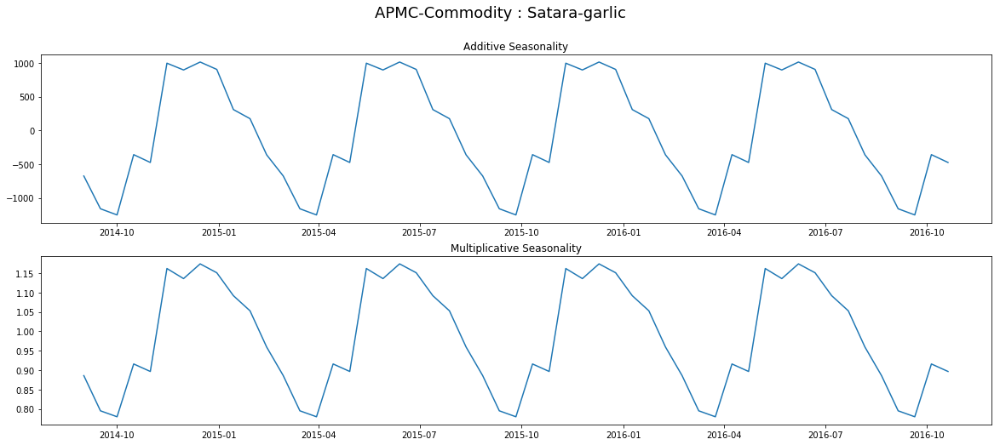

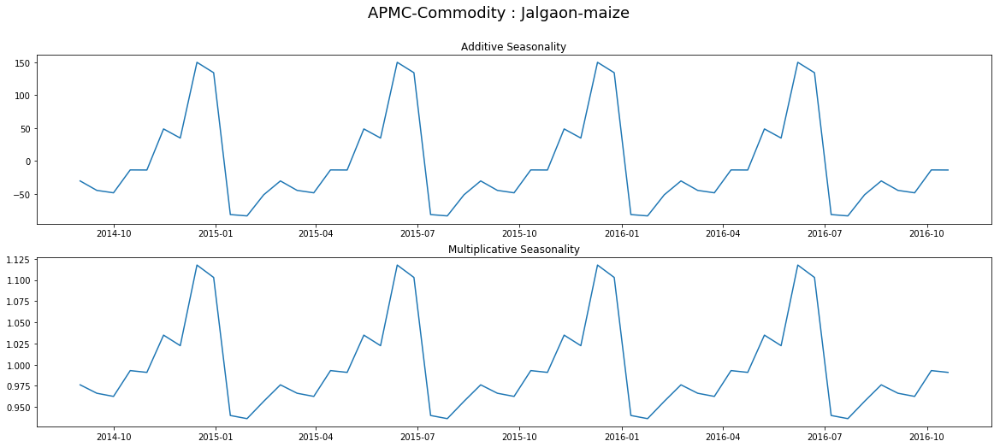

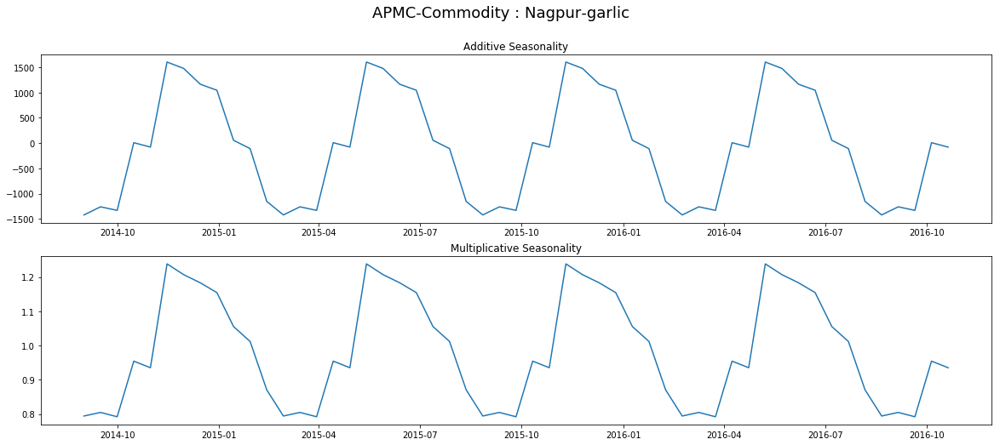

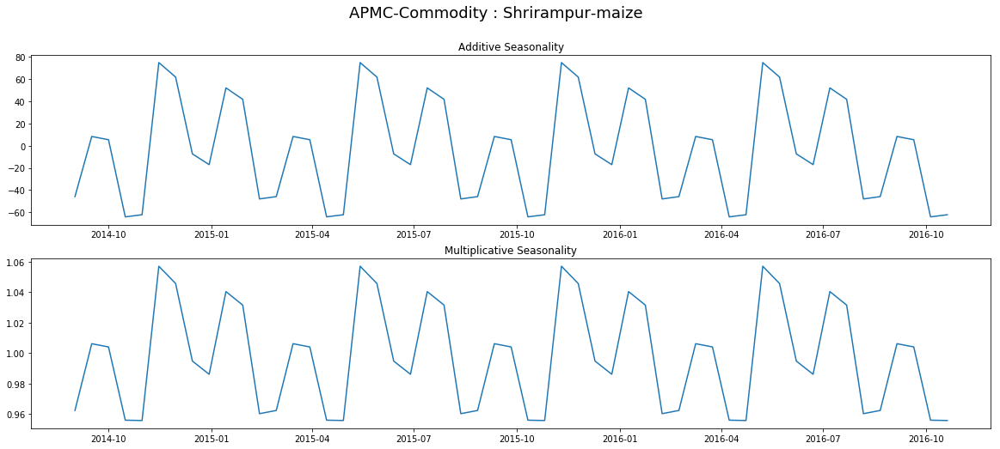

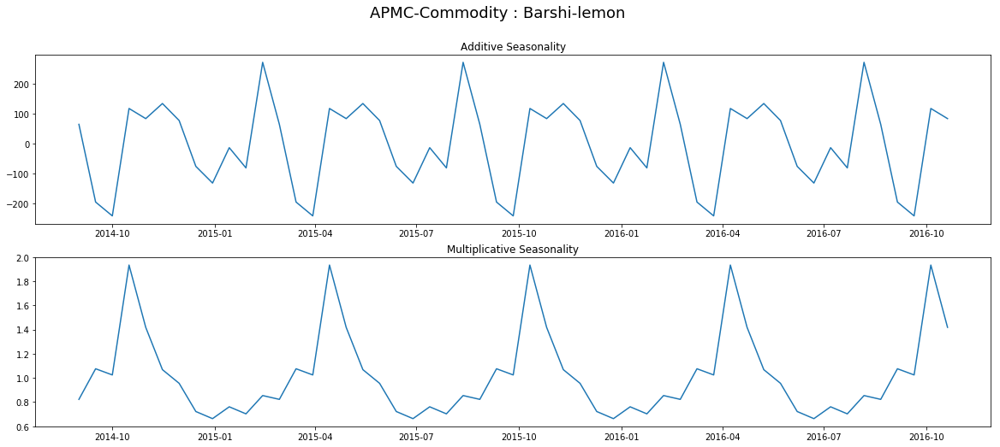

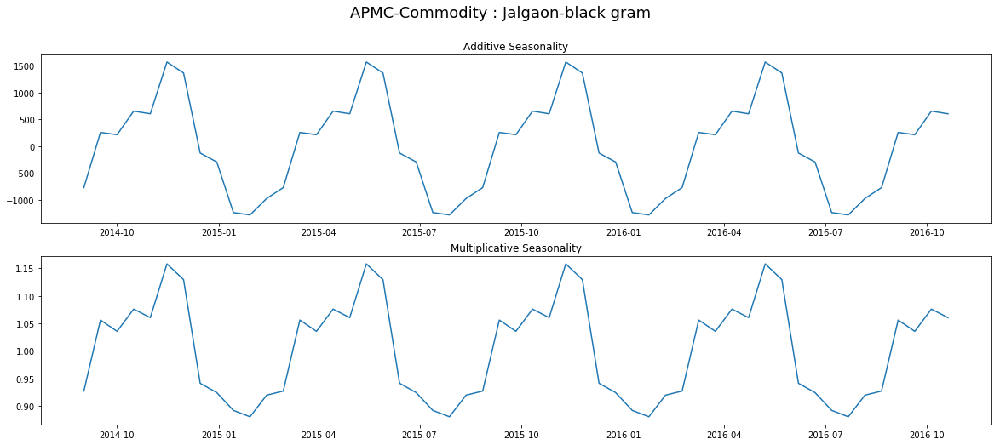

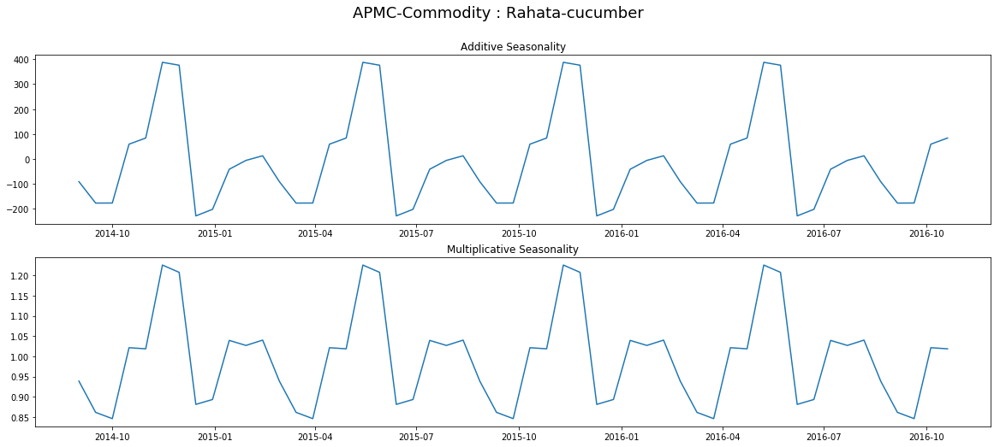

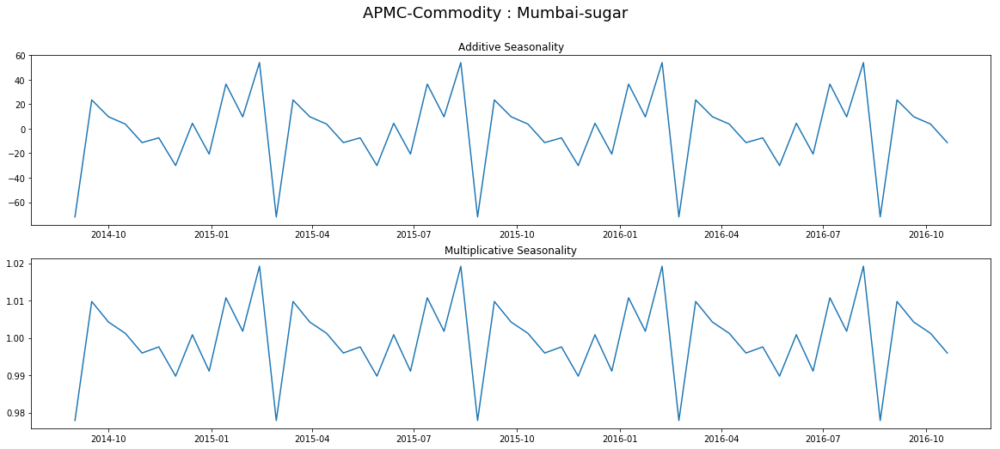

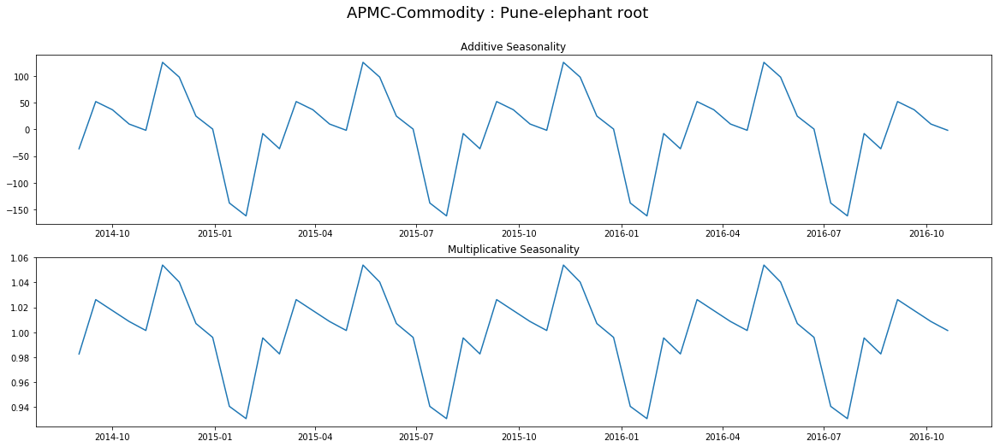

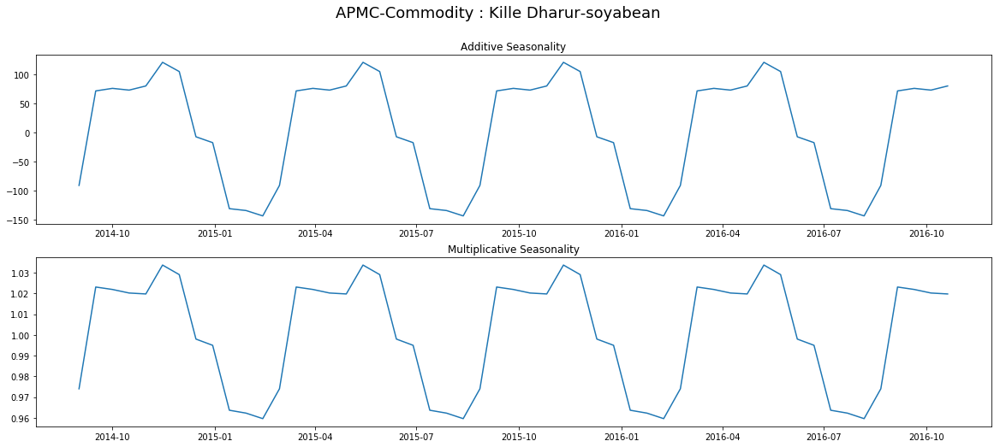

In [21]:
for apmc_commodity in monthly_data_grouped['APMC-Commodity'].value_counts()[:10].index:
    print(apmc_commodity)
    
    temp  = monthly_data_grouped[monthly_data_grouped['APMC-Commodity']==apmc_commodity] #Subsetting for apmc-commodity group
    temp2 = temp.set_index(keys='date')                                                 #setting date as index
    y     = (temp2['modal_price']).resample('15d').mean()
    y     = y.fillna(y.bfill())
    
    #Additively decomposing the timeseries
    decomposition_add = sm.tsa.seasonal_decompose(y, model='additive', freq=12,two_sided=False)
    #Multiplicatively decomposing the timeseries
    decomposition_mul = sm.tsa.seasonal_decompose(y, model='multiplicative', freq=12,two_sided=False)
    
    fig,ax = plt.subplots(2,1,figsize=(20,8))
    ax[0].plot(decomposition_add.seasonal)
    ax[0].set(title='Additive Seasonality')
    
    ax[1].plot(decomposition_mul.seasonal)
    ax[1].set(title='Multiplicative Seasonality')

    fig.suptitle('APMC-Commodity : %s'%(apmc_commodity),fontsize=18,y=0.98)

Just by looking at the charts it is hard to tell which group has what kind of seasonality.

Now, to detect seasonality in the timeseries, I will use the following steps:

    1. De-trend and de-seasonalize the timeseries using both 'additive' and 'multiplicative' models.
    2. Calculate residuals of both additive and multiplicative model.
    3. Check how much correlation in the data points is still encoded in both the residuals by calculating ACF of        both the residuals
    4. The residual having smallest sum of squared acf will be the final model. 

Since we have to compare the deseasonalized data with MSP of the commodities, from now onwards I have only considered the commodities that are there in cmo_mandi dataframe.

In [22]:
#Subetting the monthly_data_grouped dataframe for commodity values that are in cmo_mandi
monthly_data_grouped = monthly_data_grouped[monthly_data_grouped.Commodity.isin(cmo_mandi.commodity.unique())]
print('Number of APMC-Commodity pairs left after subsetting %d'%monthly_data_grouped['APMC-Commodity'].value_counts().size)
                                                                   
                                                                   

Number of APMC-Commodity pairs left after subsetting 418


Thus, now we are only left with 418 pairs of APMC-Commodity

In [23]:
monthly_data_grouped['APMC-Commodity'].unique()

array(['Akole-bajra(pearl millet/cumbu)',
       'Jamkhed-bajra(pearl millet/cumbu)',
       'Kopargaon-bajra(pearl millet/cumbu)',
       'Newasa-bajra(pearl millet/cumbu)',
       'Pathardi-bajra(pearl millet/cumbu)',
       'Rahata-bajra(pearl millet/cumbu)',
       'Rahuri-Vambori-bajra(pearl millet/cumbu)',
       'Sangamner-bajra(pearl millet/cumbu)',
       'Shevgaon-bajra(pearl millet/cumbu)',
       'Shevgaon-Bodhegaon-bajra(pearl millet/cumbu)',
       'Shrirampur-bajra(pearl millet/cumbu)',
       'Gangapur-bajra(pearl millet/cumbu)',
       'Kannad-bajra(pearl millet/cumbu)',
       'Lasur Station-bajra(pearl millet/cumbu)',
       'Beed-bajra(pearl millet/cumbu)',
       'Gevrai-bajra(pearl millet/cumbu)',
       'Kada-bajra(pearl millet/cumbu)',
       'Kille Dharur-bajra(pearl millet/cumbu)',
       'Majalgaon-bajra(pearl millet/cumbu)',
       'Parli-Vaijnath-bajra(pearl millet/cumbu)',
       'Khamgaon-bajra(pearl millet/cumbu)',
       'Malkapur-bajra(pearl millet/cum

In [24]:
monthly_data_deseason = pd.DataFrame()
for apmc_commodity in monthly_data_grouped['APMC-Commodity'].unique():
    print(apmc_commodity)
    temp_deseasonal = pd.DataFrame()
    temp  = monthly_data_grouped[monthly_data_grouped['APMC-Commodity']==apmc_commodity] #Subsetting for apmc-commodity group
    temp.sort_values(by='date',inplace=True)
    temp2 = temp.set_index(keys='date')                                                 #setting date as index
    y     = (temp2['modal_price']).resample('20d').mean()
    y     = y.fillna(y.bfill())
    
    #Additively decomposing the timeseries
    decomposition_add = sm.tsa.seasonal_decompose(y, model='additive', freq=12,two_sided=False)
    #Multiplicatively decomposing the timeseries
    decomposition_mul = sm.tsa.seasonal_decompose(y, model='multiplicative', freq=12,two_sided=False)
    #Calculating acf of additive model
    acf_add = acf(decomposition_add.resid.dropna())
    #calculating acf of multiplicative model
    acf_mul = acf(decomposition_mul.resid.dropna())
    
    if sum(acf_add**2)>sum(acf_mul**2):
        #if sum of squared acf values of additive model is > than multiplicative then seasonality is multiplicative

        temp_deseasonal['date']               = decomposition_mul.trend.index
        temp_deseasonal['APMC_Commodity']     = temp2['APMC-Commodity'].unique()[0]
        temp_deseasonal['modal_price']        = decomposition_mul.observed.values
        temp_deseasonal['Seasonality_type']   = 'Multiplicative'
        temp_deseasonal['Seasonal_Component'] =  decomposition_mul.seasonal.values
        
        #Deseasonalizing the timeseries
        temp_deseasonal['modal_price_deseasonalized'] = temp_deseasonal['modal_price']/decomposition_mul.seasonal.values
    
    else:
        temp_deseasonal['date']               = decomposition_add.trend.index
        temp_deseasonal['APMC_Commodity']     = temp2['APMC-Commodity'].unique()[0]
        temp_deseasonal['modal_price']        = decomposition_add.observed.values
        temp_deseasonal['Seasonality_type']   = 'Additive'
        temp_deseasonal['Seasonal_Component'] =  decomposition_add.seasonal.values
        
        #Deseasonalizing the timeseries
        temp_deseasonal['modal_price_deseasonalized'] = temp_deseasonal['modal_price']-decomposition_add.seasonal.values
    
    monthly_data_deseason = pd.concat([temp_deseasonal, monthly_data_deseason])
    

Akole-bajra(pearl millet/cumbu)
Jamkhed-bajra(pearl millet/cumbu)
Kopargaon-bajra(pearl millet/cumbu)
Newasa-bajra(pearl millet/cumbu)


/Users/melgazar9/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


Pathardi-bajra(pearl millet/cumbu)
Rahata-bajra(pearl millet/cumbu)
Rahuri-Vambori-bajra(pearl millet/cumbu)
Sangamner-bajra(pearl millet/cumbu)
Shevgaon-bajra(pearl millet/cumbu)
Shevgaon-Bodhegaon-bajra(pearl millet/cumbu)
Shrirampur-bajra(pearl millet/cumbu)
Gangapur-bajra(pearl millet/cumbu)
Kannad-bajra(pearl millet/cumbu)
Lasur Station-bajra(pearl millet/cumbu)
Beed-bajra(pearl millet/cumbu)
Gevrai-bajra(pearl millet/cumbu)
Kada-bajra(pearl millet/cumbu)
Kille Dharur-bajra(pearl millet/cumbu)
Majalgaon-bajra(pearl millet/cumbu)
Parli-Vaijnath-bajra(pearl millet/cumbu)
Khamgaon-bajra(pearl millet/cumbu)
Malkapur-bajra(pearl millet/cumbu)
Nandura-bajra(pearl millet/cumbu)
Dhule-bajra(pearl millet/cumbu)
Dondaicha-bajra(pearl millet/cumbu)
Shirpur-bajra(pearl millet/cumbu)
Chopda-bajra(pearl millet/cumbu)
Jalgaon-bajra(pearl millet/cumbu)
Jalna-bajra(pearl millet/cumbu)
Partur-bajra(pearl millet/cumbu)
Latur-bajra(pearl millet/cumbu)
Nandurbar-bajra(pearl millet/cumbu)
Shahada-bajra

Murum-soyabean
Umarga-soyabean
Jintur-soyabean
Parbhani-soyabean
Sailu-soyabean
Sangali-soyabean
Hinganghat-soyabean
Karanja-soyabean
Mangrulpeer-soyabean
Manora-soyabean
Risod-soyabean
Washim-soyabean
Babhulgaon-soyabean
Digras-soyabean
Ner Parasopant-soyabean
Umarkhed-soyabean
Umarkhed-Danki-soyabean
Yeotmal-soyabean
Shegaon-mustard
Akole-paddy-unhusked
Pavani-paddy-unhusked
Tumsar-paddy-unhusked
Brahmpuri-paddy-unhusked
Gondpimpri-paddy-unhusked
Mul-paddy-unhusked
Nagbhid-paddy-unhusked
Aheri-paddy-unhusked
Armori-paddy-unhusked
Armori-Desaiganj-paddy-unhusked
Chamorshi-paddy-unhusked
Gadchiroli-paddy-unhusked
Aamgaon-paddy-unhusked
Arjuni Morgaon-paddy-unhusked
Tiroda-paddy-unhusked
Bhiwapur-paddy-unhusked
Karjat (Raigad)-paddy-unhusked
Pen-paddy-unhusked
Roha-paddy-unhusked
Barshi-paddy-unhusked
Murbad-paddy-unhusked
Ausa-sunflower
Kalamb (Os)-sunflower
Umarga-sunflower
Ausa-safflower
Kalamb (Os)-safflower
Tumsar-rice(paddy-hus)
Nagpur-rice(paddy-hus)
Umared-rice(paddy-hus)
Pune-r

In [25]:
monthly_data_deseason.head()

,date,APMC_Commodity,modal_price,Seasonality_type,Seasonal_Component,modal_price_deseasonalized
0,2014-09-01,Mumbai-coconut,1681.0,Multiplicative,1.051940,1597.999307
1,2014-09-21,Mumbai-coconut,1635.0,Multiplicative,1.050525,1556.365081
2,2014-10-11,Mumbai-coconut,1588.0,Multiplicative,1.044339,1520.578799
3,2014-10-31,Mumbai-coconut,1588.0,Multiplicative,1.045450,1518.963467
4,2014-11-20,Mumbai-coconut,1609.0,Multiplicative,1.035211,1554.272594


Now we have a dataframe where we have deseasonalized the modal_price

### Compare raw and de-seasoned prices with MSPs

To compare raw and de-seasoned price with their respectives MSPs and also compare all APMC-Commodity groups, I will plot percentages of how much raw and deseasoned prices differ with respective MSPs. The reasoning for calculating percentages is that percentages give us ability to also compare different APMC-Commodity groups.

In [26]:
#Creating an Commodity column in monthly_data_deseason dataframe
monthly_data_deseason['commodity'] = monthly_data_deseason['APMC_Commodity'].apply(lambda x:x.split('-')[1])

#Creating year column in monthly_data_deseason
monthly_data_deseason['year'] = monthly_data_deseason.date.dt.year

#Joining cmo mandi to monthly_data_deseason based on commodity and year
final_df = monthly_data_deseason.merge(cmo_mandi,on=['commodity','year'],copy=False)

In [27]:
#Calculating percentage fluctuation
final_df['Percentage_fluc_des'] = round(((final_df.modal_price_deseasonalized - final_df.msprice)/final_df.msprice)*100,2)
final_df['Percentage_fluc_raw'] = round(((final_df.modal_price_deseasonalized - final_df.msprice)/final_df.msprice)*100,2)


In [28]:
final_df.head()

,date,APMC_Commodity,modal_price,Seasonality_type,Seasonal_Component,modal_price_deseasonalized,commodity,year,Type,msprice,msp_filter,Percentage_fluc_des,Percentage_fluc_raw
0,2014-09-01,Mumbai-coconut,1681.0,Multiplicative,1.051940,1597.999307,coconut,2014,Other Crops,1425.0,1,12.14,12.14
1,2014-09-21,Mumbai-coconut,1635.0,Multiplicative,1.050525,1556.365081,coconut,2014,Other Crops,1425.0,1,9.22,9.22
2,2014-10-11,Mumbai-coconut,1588.0,Multiplicative,1.044339,1520.578799,coconut,2014,Other Crops,1425.0,1,6.71,6.71
3,2014-10-31,Mumbai-coconut,1588.0,Multiplicative,1.045450,1518.963467,coconut,2014,Other Crops,1425.0,1,6.59,6.59
4,2014-11-20,Mumbai-coconut,1609.0,Multiplicative,1.035211,1554.272594,coconut,2014,Other Crops,1425.0,1,9.07,9.07


#### Plotting timeseries of price fluctuations of 10 APMC-Commodity groups
 


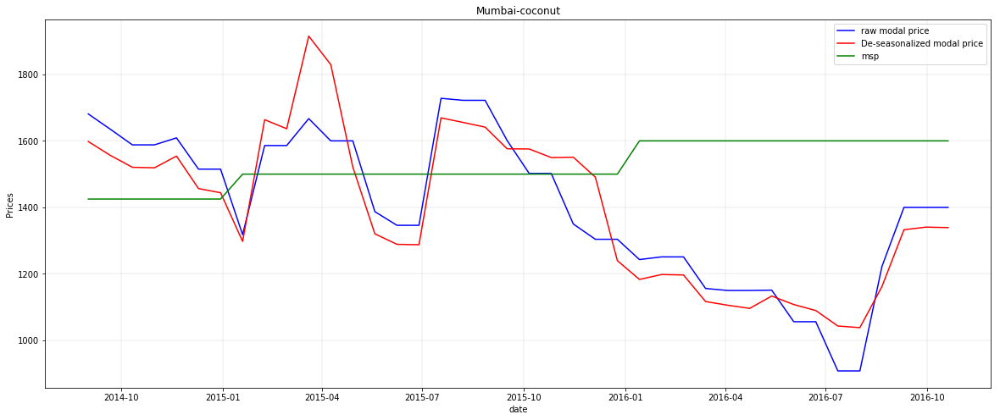

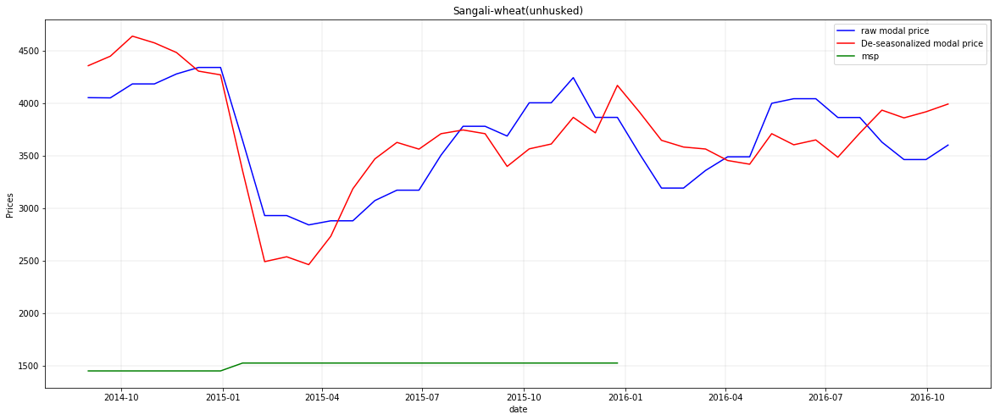

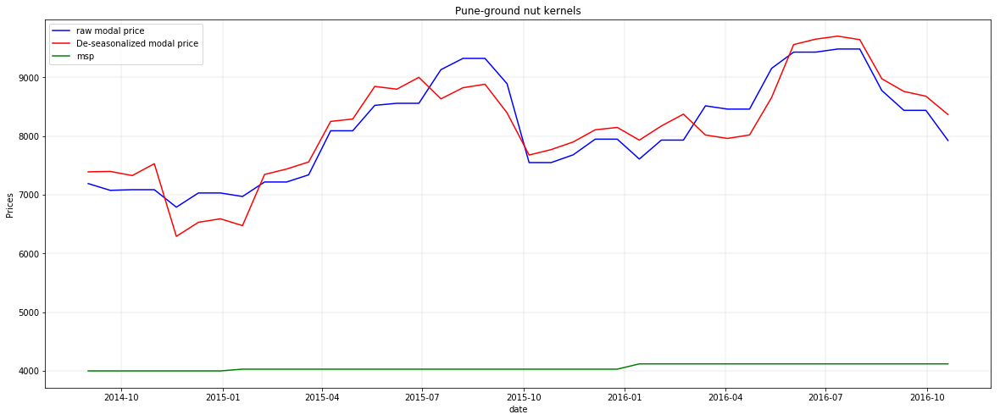

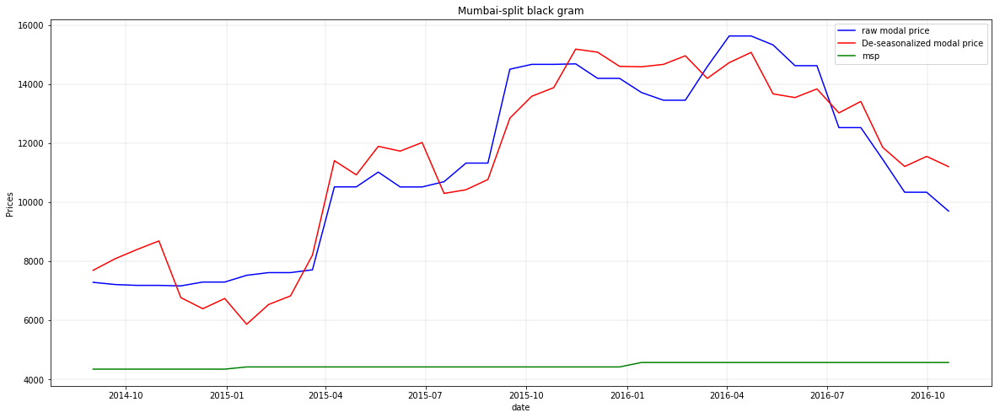

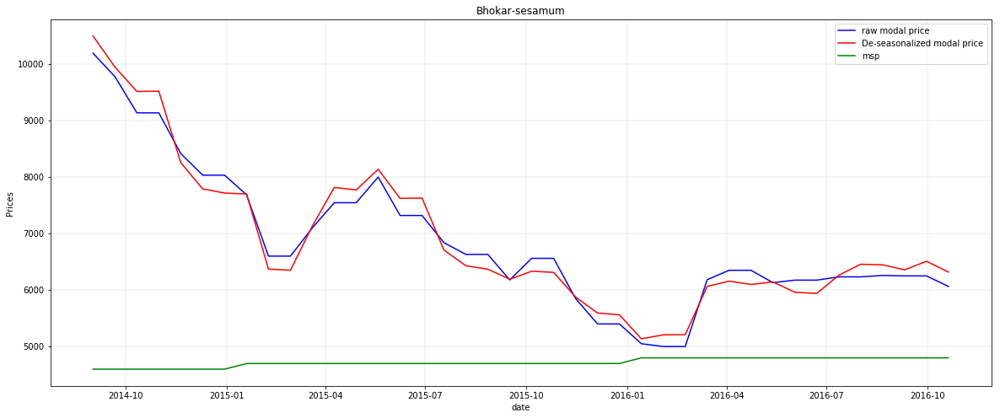

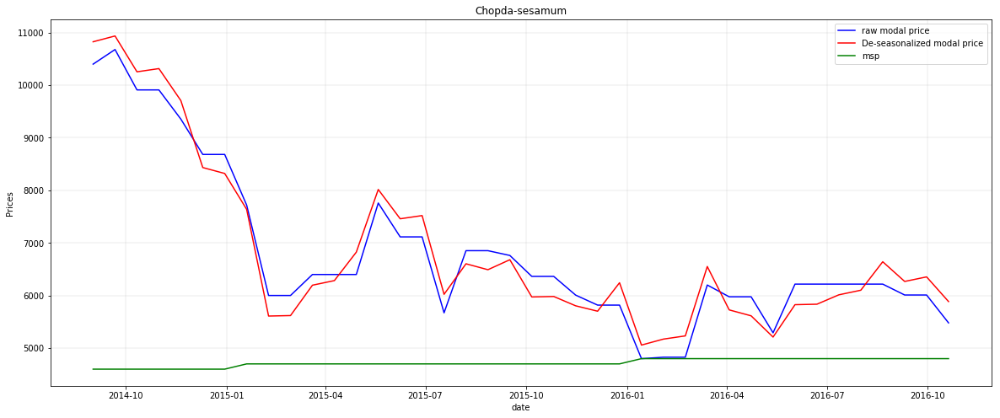

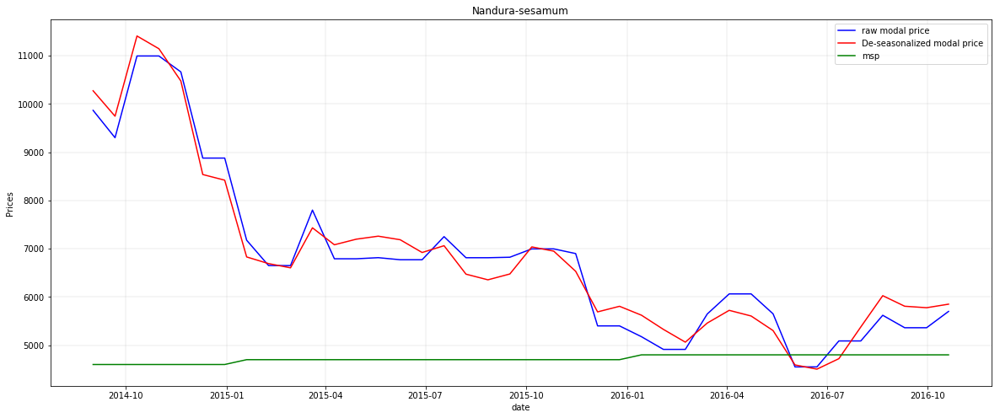

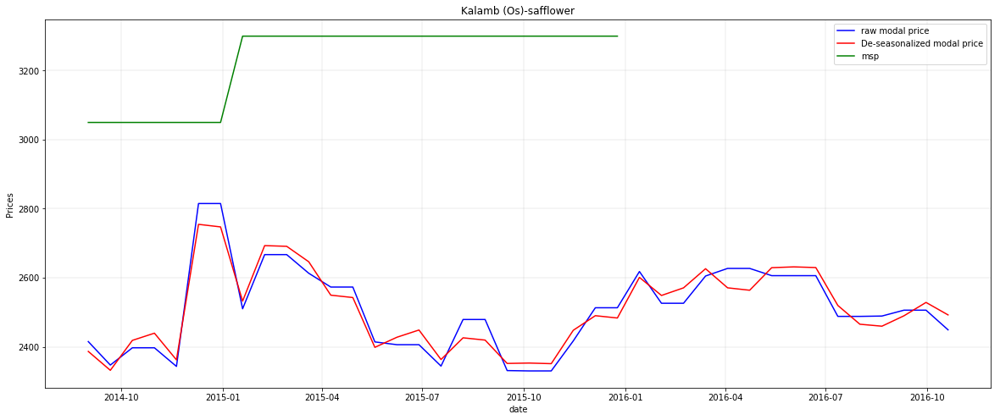

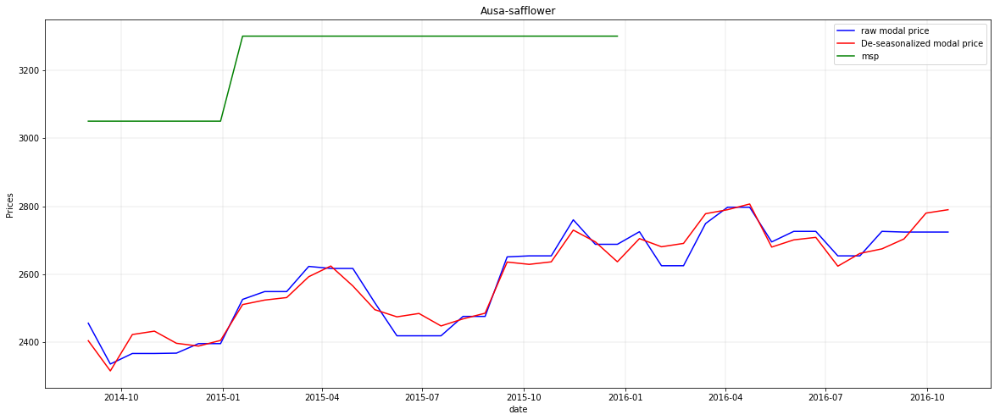

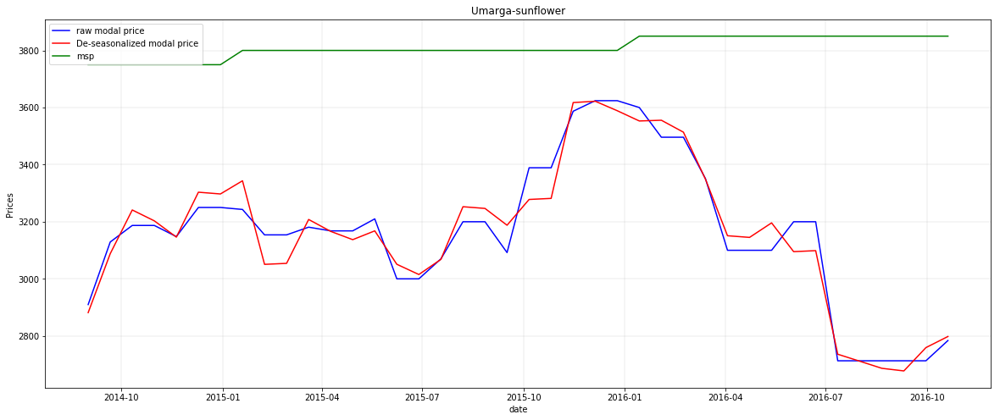

In [29]:
for apmc_commodity in final_df.APMC_Commodity.unique()[:10]:
    temp = final_df[final_df.APMC_Commodity==apmc_commodity]
    fig,ax = plt.subplots(1,1,figsize=(20,8))
    ax.plot(temp.date,temp.modal_price,'-b',label='raw modal price')
    ax.plot(temp.date,temp.modal_price_deseasonalized,'-r',label='De-seasonalized modal price')
    ax.plot(temp.date,temp.msprice,'-g',label='msp')
    ax.set(ylabel='Prices',xlabel='date',title=apmc_commodity)
    ax.legend()
    ax.grid(linewidth=0.25)

From the above plots we can concur :
1. There is very little difference between raw and deseasonalized timeseries. This tells us that either there is no seasonality in the data or we do not have enough data points for seasonality detection.
2. Since there is little difference between raw and deseasonalized, the deviation of both of these series from MSP is also not much different

#### Plotting Price fluctuations of all APMC-Commodity groups

/Users/melgazar9/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


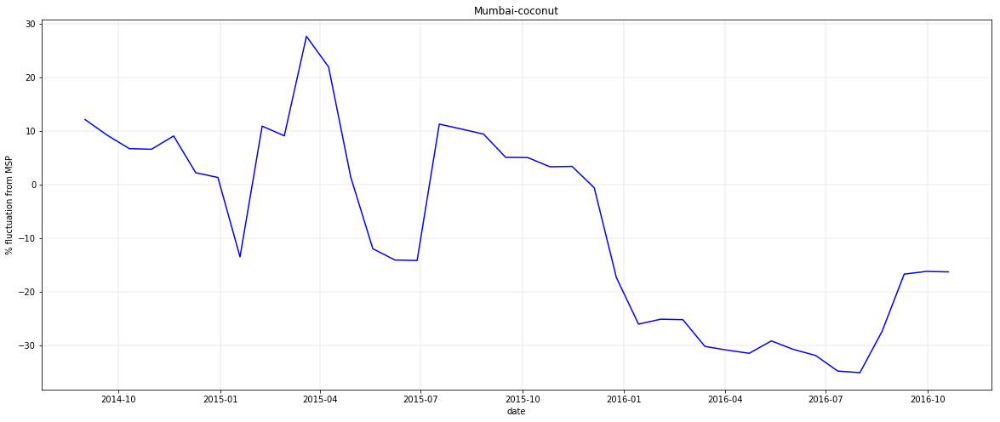

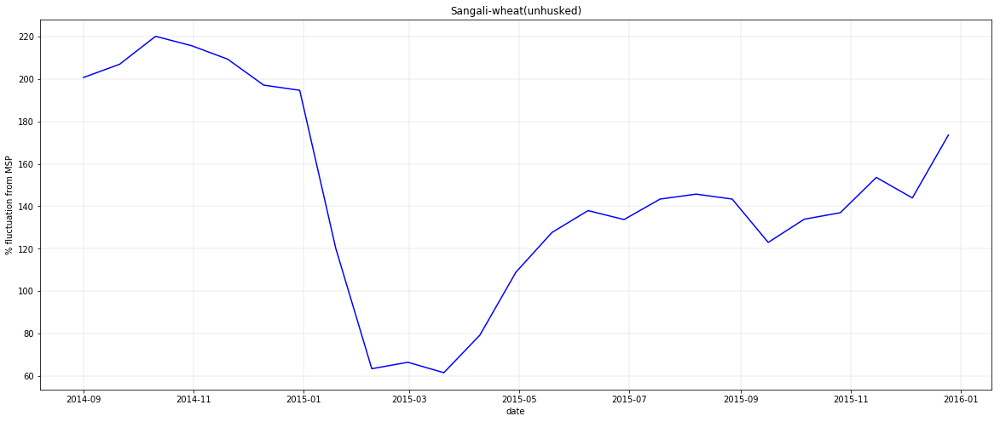

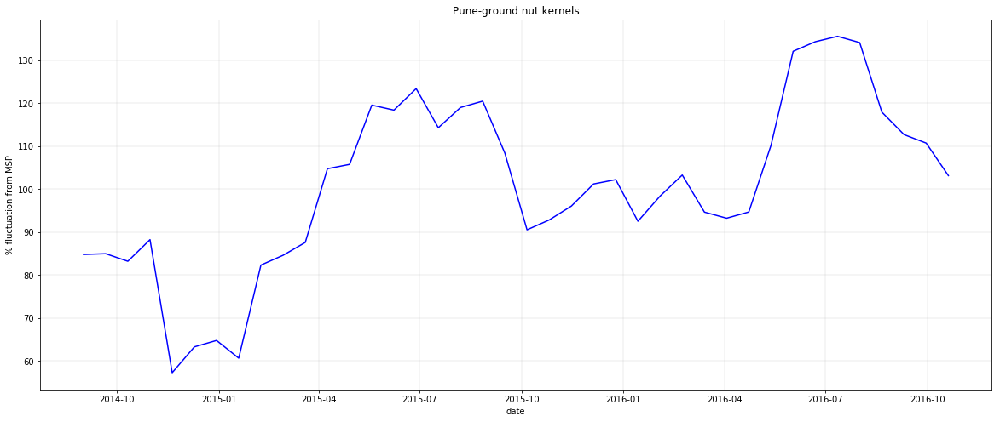

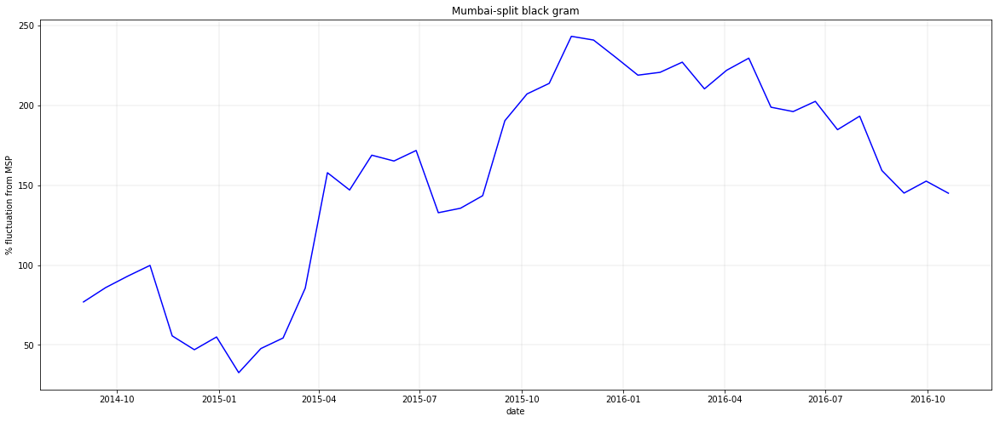

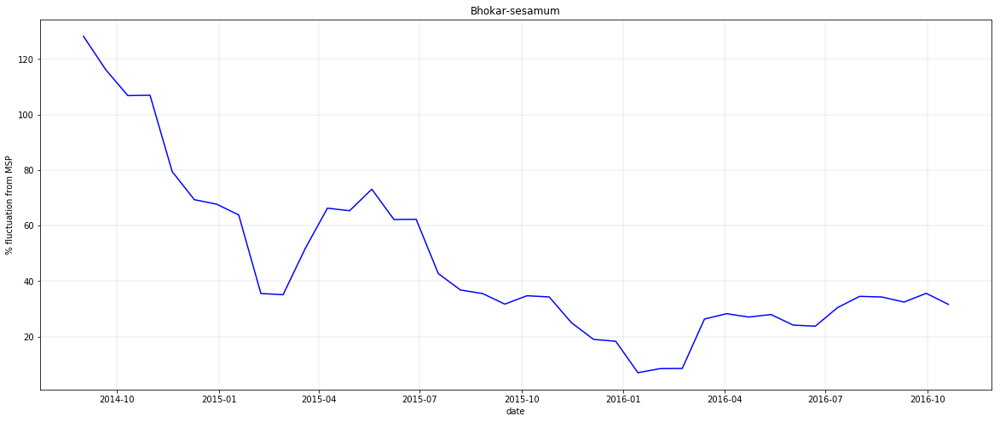

...

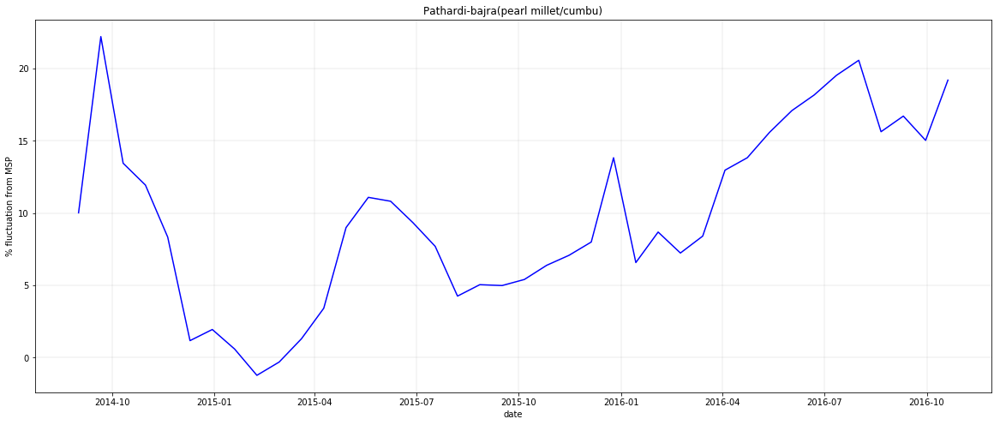

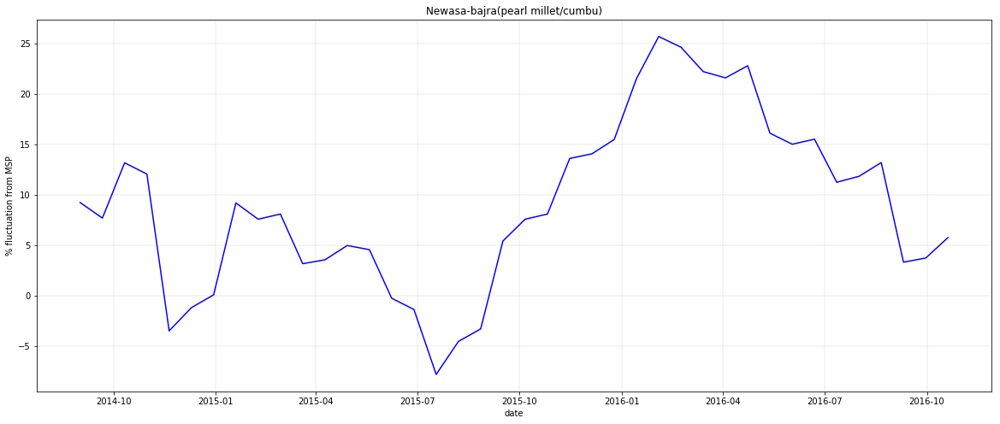

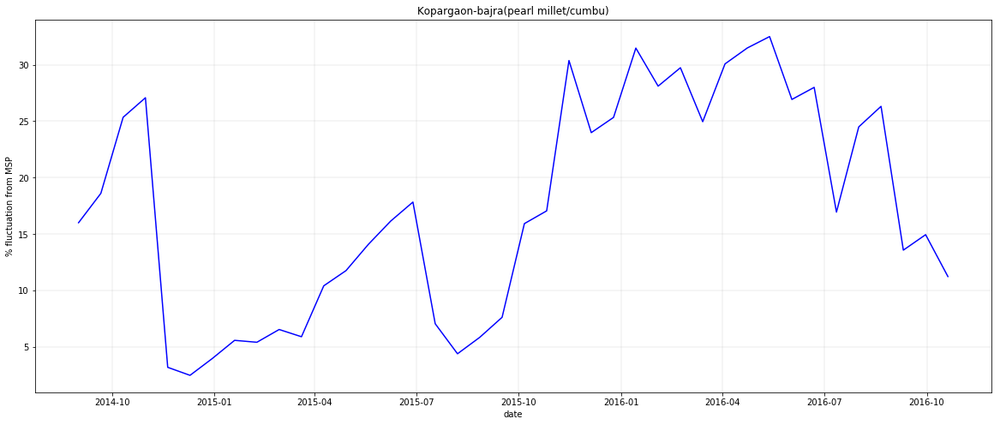

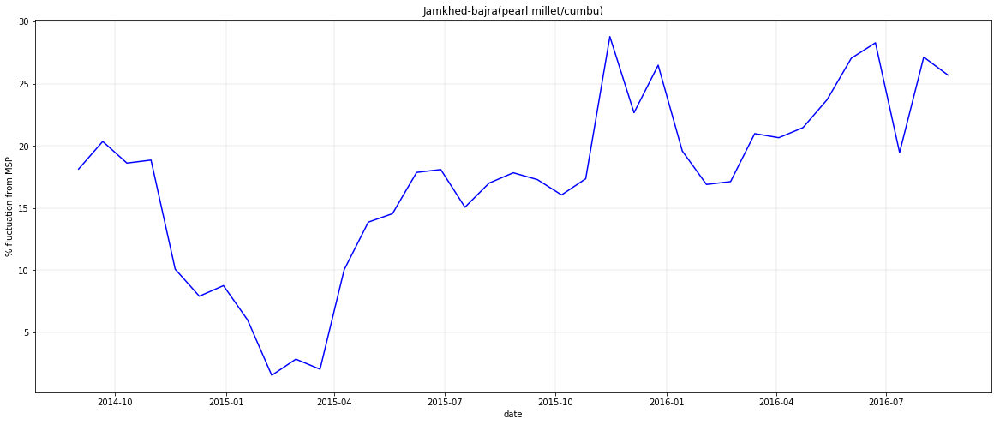

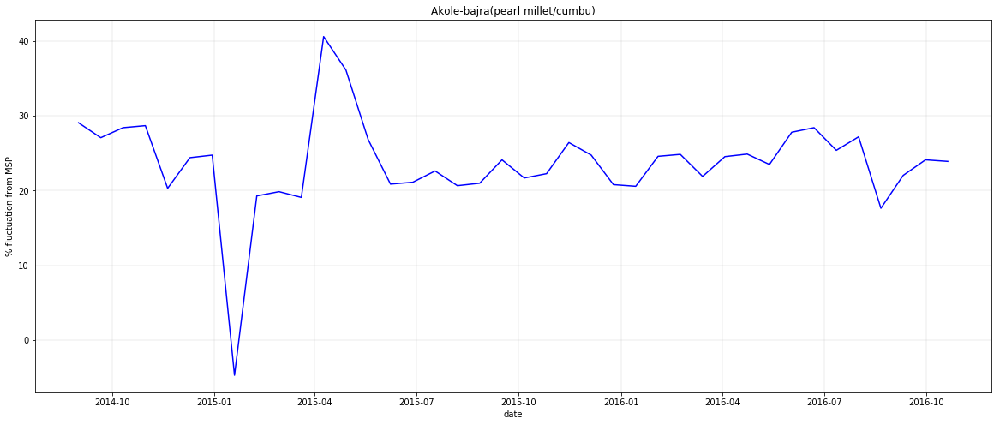

In [30]:
for apmc_commodity in final_df.APMC_Commodity.unique():
    temp = final_df[final_df.APMC_Commodity==apmc_commodity]
    fig,ax = plt.subplots(1,1,figsize=(20,8))
    ax.plot(temp.date,temp.Percentage_fluc_des,'-b')
    ax.set(ylabel='% fluctuation from MSP',xlabel='date',title=apmc_commodity)
    ax.grid(linewidth=0.25)
    

### Deviation From MSP

####  To understand deviation of modal Price from MSP the following methodology is adopted:
 - Standard deviation of de-seasonalized modal price is of each and every commodity across all APMCs is     calculated per year.
 - Then, Standard deviation of each APMC-Commodity group is calculated per year.
 - Finally, a ratio of standard deviation of de-seasonalized modal price of every commodity and StdDev of each APMC-Commodity group is calculated to measure fluctuations in price
 
#### Calculating deviation from MSP per year

In [31]:
#Calculating standard deviation of modal price of each commodity per year
commodity_stddev = {}
for commodity in final_df.commodity.unique():
    temp  = final_df[final_df.commodity==commodity]
    
    commodity_stddev[commodity] = {}
    
    for year in temp.date.dt.year.unique(): 
        temp2 = temp[temp.date.dt.year==year]
        commodity_stddev[commodity][year] = round(np.std(temp2.modal_price_deseasonalized),2)
    
apmc_commodity_stddev = {}
#Calculating standard deviation of modal price of each apmc-commodity group per year
for apmc_commodity in final_df.APMC_Commodity.unique():
    temp = final_df[final_df.APMC_Commodity==apmc_commodity]
    
    apmc_commodity_stddev[apmc_commodity] = {}
    
    for year in temp.date.dt.year.unique():
        temp2 = temp[temp.date.dt.year==year]
        apmc_commodity_stddev[apmc_commodity][year] = round(np.std(temp2.modal_price_deseasonalized),2)

Calculating the ratio of apmc-commodity group modal price std commodity  modal price std for every year

In [32]:
ratio_std = {}
for commodity in commodity_stddev.keys():
    apmc_commodity_list = [apmc_commodity for apmc_commodity in apmc_commodity_stddev.keys() if commodity==apmc_commodity.split('-')[1]]
    for apmc_com in apmc_commodity_list:
        ratio_std[apmc_com]={}
        for year in apmc_commodity_stddev[apmc_com].keys():
            ratio_std[apmc_com][year] = apmc_commodity_stddev[apmc_com][year]/commodity_stddev[commodity][year]
            

In [33]:
#Converting the ratio_std dictionary to dataframe 
ratio_std_df = pd.DataFrame(ratio_std).T.reset_index().rename(columns={'index':'APMC_Commodity'})
ratio_std_df.head()

,APMC_Commodity,2014,2015,2016
0,Mumbai-coconut,1.000000,1.000000,1.000000
1,Sangali-wheat(unhusked),1.000000,1.000000,1.000000
2,Pune-ground nut kernels,1.000000,1.000000,1.000000
3,Mumbai-split black gram,1.000000,1.000000,1.000000
4,Bhokar-sesamum,0.915547,1.156331,0.836662


#### Visualizing apmc-commodity pairs that have maximum and minimum fluctuations in modal price per year

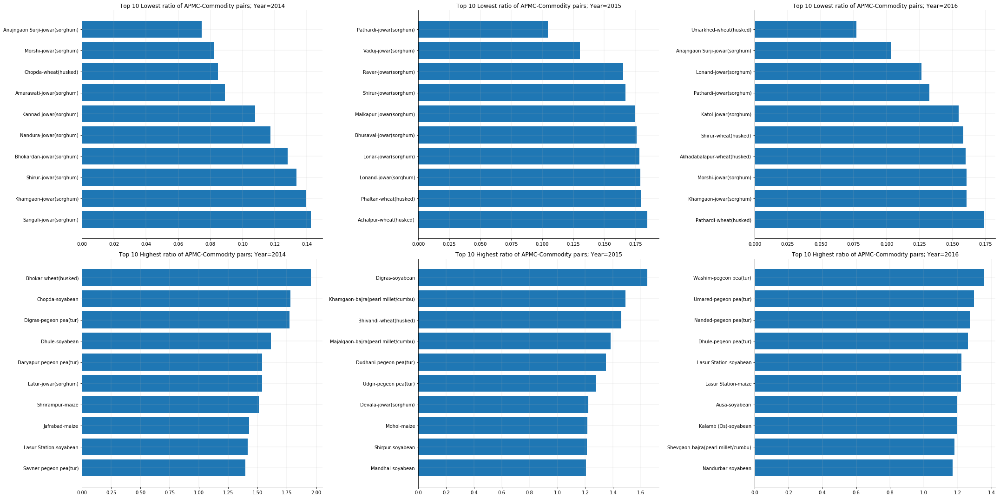

In [35]:
fig,ax = plt.subplots(2,3,figsize=(30,15))
part_title = ['Lowest','Highest']
years      = [2014,2015,2016]  
for i in range(2):
    for j in range(3):
        if part_title[i]=='Lowest':
            ratio_std_df.sort_values(by=years[j],inplace=True)
        else:
            ratio_std_df.sort_values(by=years[j],inplace=True,ascending=False)
        
        ax[i,j].barh(ratio_std_df.APMC_Commodity[:10].values,ratio_std_df[years[j]][:10].values)
        ax[i,j].set(title='Top 10 %s ratio of APMC-Commodity pairs; Year=%d'%(part_title[i],years[j]))
        ax[i,j].grid(linewidth=0.25)
        ax[i,j].invert_yaxis()
        ax[i,j].spines['top'].set_visible(False)
        ax[i,j].spines['right'].set_visible(False)
plt.tight_layout()

From the above analysis we can conclude:
- In the year **2014**:
    - Commodity **wheat(husked)** in APMC **Bhokar** had greatest fluctuation in prices as compared to all other commodities.
- In the year **2015**:
    - Commodity **Soyabean** in APMC **Digras** had the largest fluctuation in price as compared to all other commodities.
- In the year **2016**:
    - Commodity **Pegeon pea (tur)** in APMC **Washim** had the largest fluctuation in price as compared to all other commodities.
    
Also, **low value of ratio** means that the commodity in that particular APMC had very **stable modal prices** as compared to all the other commodities in other APMCs